## Adversarial Attack #1 - Cloud Artifact -  TF Object Detection 

Adversarial attack for SkyScan Audit of Phase 2 "scripts" TF object detection performed by Ricardo Calix.

TF object detection is here: https://github.com/tensorflow/models/tree/master/research/object_detection

Note: The phase 2 "scripts" use the TF object detection module. The mechanism is to use python's subprocess function to invoke the functions and scripts in the tensorflow object detection repo.

This notebook shows:

* fine tuning with normal training data and adversarial data
* model attacked: SSD_resnet50_1024x1024
* TF object detection 8 classes model
* Performance metrics (precision, recall, f1-measure, confusion matrix)
* Dataset splits: train (70%), test (15%), adversarial (15%)


## Compile protobufs and install the object_detection package

You also need to install protoc from the proto website compatible with the OS

This installation sequence worked for me:
https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/install.html

In [1]:


'''


docker exec -it ml-model_jupyter_1  /bin/bash

do the following in the terminal of the container

download object detection from tensorflow

%%bash
cd models/research/

pip install pycocotools

## the downloaded protoc must be used
## From within TensorFlow/models/research/
## I copied protoc here
protoc object_detection/protos/*.proto --python_out=.


## From within TensorFlow/models/research/
cp object_detection/packages/tf2/setup.py .
python -m pip install --use-feature=2020-resolver .


# From within TensorFlow/models/research/
python object_detection/builders/model_builder_tf2_test.py


############################################
## NOT THIS
############################################
## python -m pip install .
## From /models/research/ 
## python setup.py build
## python setup.py install
############################################



'''



'\n\n\ndocker exec -it ml-model_jupyter_1  /bin/bash\n\ndo the following in the terminal of the container\n\ndownload object detection from tensorflow\n\n%%bash\ncd models/research/\n\npip install pycocotools\n\n## the downloaded protoc must be used\n## From within TensorFlow/models/research/\n## I copied protoc here\nprotoc object_detection/protos/*.proto --python_out=.\n\n\n## From within TensorFlow/models/research/\ncp object_detection/packages/tf2/setup.py .\npython -m pip install --use-feature=2020-resolver .\n\n\n# From within TensorFlow/models/research/\npython object_detection/builders/model_builder_tf2_test.py\n\n\n############################################\n## NOT THIS\n############################################\n## python -m pip install .\n## From /models/research/ \n## python setup.py build\n## python setup.py install\n############################################\n\n\n\n'

## Import Libraries

In [2]:


import os
import pathlib
import numpy as np
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import matplotlib
import random
import io
import imageio
import glob
import time
import scipy.misc

import sklearn
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score, accuracy_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage
from six import BytesIO


from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util


from object_detection.utils import config_util
from object_detection.utils import visualization_utils as vis_util
from object_detection.utils import visualization_utils as viz_utils
## from object_detection.utils import colab_utils
from object_detection.builders import model_builder


%matplotlib inline



## TensorFlow Patches

In [3]:


# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile



## Adversarial artifact

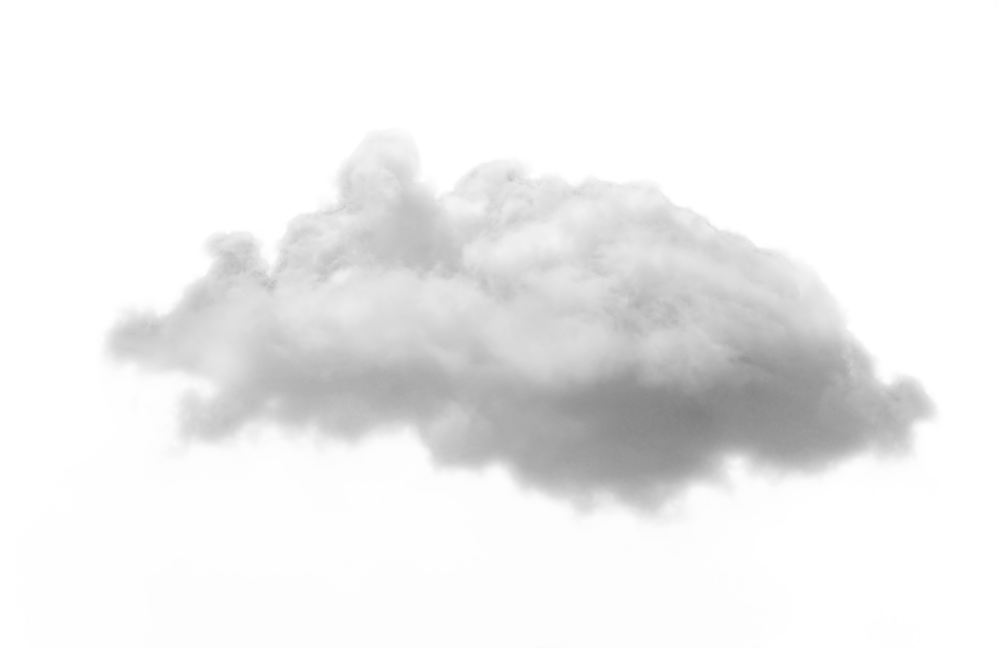

In [4]:

adversarial_artifact = Image.open('adversarial_imgs/cloud3.png')


adversarial_artifact


## Parameters

In [5]:

num_classes = 8 

path_model_gz       = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'

##########################################
## SSD model. Fast but less accurate
model_to_use_gz     = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz'
model_to_use_config = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.config'
##########################################


# These parameters can be tuned; since our training set has 8,000ish images
# it makes sense to have a much larger batch size

batch_size = 16
learning_rate = 0.01
num_batches = 200         ## 100

# By convention, classes start counting at 1
label_id_offset = 1

number_of_samples_to_train_on_per_class = 300

##################################
## this threshold is for the classes. It affects the performance metrics directly.
## if too high, it may not predict a class. By setting it to 0.0, you
## improve chances that it picks a class
threshold                 = 0.0    

##################################
## this threshold is for the bounding boxes; if 0.0, it will provide too many bounding boxes
## setting at 0.3 seems to provide a reasonable set of boxes (preferably just one)
## this is for visualization only and does not affect performance metrics
plot_detections_threshold = 0.3    




## Download TF models from Tensorflow which includes "object detection"


In [6]:

'''

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models
    
'''


'\n\nif "models" in pathlib.Path.cwd().parts:\n  while "models" in pathlib.Path.cwd().parts:\n    os.chdir(\'..\')\nelif not pathlib.Path(\'models\').exists():\n  !git clone --depth 1 https://github.com/tensorflow/models\n    \n'

## This is a label map as reference

In [7]:



# change to Lable map for skyscan
category_index = {
    1: {'id': 1, 'name': 'person'},
    2: {'id': 2, 'name': 'bicycle'},
    3: {'id': 3, 'name': 'car'},
    4: {'id': 4, 'name': 'motorcycle'},
    5: {'id': 5, 'name': 'airplane'},
    6: {'id': 6, 'name': 'bus'},
    7: {'id': 7, 'name': 'train'},
    8: {'id': 8, 'name': 'truck'},
    9: {'id': 9, 'name': 'boat'},
    10: {'id': 10, 'name': 'traffic light'},
    11: {'id': 11, 'name': 'fire hydrant'},
    13: {'id': 13, 'name': 'stop sign'},
    14: {'id': 14, 'name': 'parking meter'},
    15: {'id': 15, 'name': 'bench'},
    16: {'id': 16, 'name': 'bird'},
    17: {'id': 17, 'name': 'cat'},
    18: {'id': 18, 'name': 'dog'},
    19: {'id': 19, 'name': 'horse'},
    20: {'id': 20, 'name': 'sheep'},
    21: {'id': 21, 'name': 'cow'},
    22: {'id': 22, 'name': 'elephant'},
    23: {'id': 23, 'name': 'bear'}
}



## Fine Tune ML pipeline and other utility functions

You need:

* images
* label maps
* annotated boxes
* pre-trained models and config files
* original and adversarial samples 


## Function to load image as numpy arrays

Load an image from file into a numpy array.

Puts image into numpy array to feed into tensorflow graph. Note that by convention it is put into a numpy array with shape (height, width, channels), where channels=3 for RGB.

Args: path: a file path.

Returns: uint8 numpy array with shape (img_height, img_width, 3)



In [8]:

def load_image_into_numpy_array(path):
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)


## Function plot detections

Wrapper function to visualize detections.

Args:

image_np: uint8 numpy array with shape (img_height, img_width, 3)

boxes: a numpy array of shape [N, 4]

classes: a numpy array of shape [N]. Note that class indices are 1-based,
  and match the keys in the label map.

scores: a numpy array of shape [N] or None.  If scores=None, then
  this function assumes that the boxes to be plotted are groundtruth
  boxes and plot all boxes as black with no classes or scores.

category_index: a dict containing category dictionaries (each holding
  category index `id` and category name `name`) keyed by category indices.

figsize: size for the figure.

image_name: a name for the image file.

In [9]:


def plot_detections(image_np, boxes, classes, scores, category_index, figsize=(12, 16), image_name=None):

  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=plot_detections_threshold)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)




In [10]:

def print_stats_percentage_train_test( y_test, y_pred):    
      
     print('Accuracy: %.2f' % accuracy_score(y_test,   y_pred) )
     
     confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
     print("confusion matrix")
     print(confmat)
     print('Precision: %.3f' % precision_score(y_true=y_test, y_pred=y_pred, average='weighted'))
     print('Recall: %.3f' % recall_score(y_true=y_test, y_pred=y_pred, average='weighted'))
     print('F1-measure: %.3f' % f1_score(y_true=y_test, y_pred=y_pred, average='weighted'))
   


In [11]:

def gif_func(filenames, name):
    imageio.plugins.freeimage.download()
    anim_file = name
    images = []
    for filename in filenames:
        image = imageio.imread(filename)
        images.append(image)
    imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)



In [12]:

# uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.



In [13]:

# Set up forward + backward pass for a single train step

def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 640x640.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    shapes = tf.constant(batch_size * [[1024, 1024, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn



## Pre-annotated boxes as reference

In [14]:
'''

gt_boxes = [
             np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
             np.array([[0.539, 0.583, 0.73, 0.71]],   dtype=np.float32),
             np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
             np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
             np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
]

'''


'\n\ngt_boxes = [\n             np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),\n             np.array([[0.539, 0.583, 0.73, 0.71]],   dtype=np.float32),\n             np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),\n             np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),\n             np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)\n]\n\n'

In [15]:

def get_skyscan_box_data(box_image_path):
    f = open(box_image_path )
    the_info = f.read()
    f.close()

    ## print(the_info)
    the_info = the_info.replace("\n","")
    temp_lst = the_info.split(" ")
    ## print(temp_lst[1:])
    return temp_lst[1:]



# Step 0: Download and initialize the pre-trained model

Here we create the model and restore weights for all but last layer.

In this cell a single stage detection architecture (RetinaNet) is built

All but the classification layer at the top (which will be automatically randomly initialized) is restored.

For simplicity, a number of things are hardcoded for the specific RetinaNet architecture used (including assuming that the image size will always be 1024x1024), however it is not difficult to generalize to other model configurations.


In [16]:

# Download the checkpoint and put it into models/research/object_detection/test_data/

full_path_model_gz = path_model_gz + model_to_use_gz

!wget $full_path_model_gz
!tar -xf $model_to_use_gz
move_model_gz = model_to_use_gz.replace(".tar.gz", "") + '/checkpoint'
!mv $move_model_gz models/research/object_detection/test_data/




--2022-11-30 11:25:18--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.1.112, 2607:f8b0:4009:805::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.1.112|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244755628 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz.3’

ssd_resnet50_v1_fpn 100%[===================>] 233.42M  6.54MB/s    in 41s     

2022-11-30 11:25:59 (5.74 MB/s) - ‘ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz.3’ saved [244755628/244755628]

mv: cannot move 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/checkpoint' to 'models/research/object_detection/test_data/checkpoint': Directory not empty


## Load pipeline config and build a detection model

Since working off of a COCO architecture which predicts 90 class slots by default, we override the num_classes field here to be just one (for the new rubber ducky class).

Set up object-based checkpoint restore --- RetinaNet has two prediction heads --- one for classification, the other for box regression.

This restores the box regression head but initializes the classification head from scratch (the omission is shown below by commenting out the line that would be added if both heads were to be restored


In [17]:

tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)

pipeline_config = 'models/research/object_detection/configs/tf2/' + model_to_use_config
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']

## print(model_config)

#####################################################
## if SSD model
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True

####################################################
## if fast R-cnn
## model_config.faster_rcnn.num_classes = num_classes
## model_config.faster_rcnn.freeze_batchnorm = True
####################################################



Building model and restoring weights for fine-tuning...


In [18]:

detection_model = model_builder.build(model_config=model_config, is_training=True)


In [19]:


fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )

fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)

ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 1024, 1024, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

print('Weights restored!')



Weights restored!



## Eager mode custom training loop


In [20]:


tf.keras.backend.set_learning_phase(True)

# Select variables in top layers to fine-tune

trainable_variables = detection_model.trainable_variables

to_fine_tune = []

prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead'
]


/usr/local/lib/python3.6/dist-packages/keras/backend.py:401: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


In [21]:

for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)


In [22]:


optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)

train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)



## Step 1: Create category_index and reverse dictionaries

In [23]:

train_image_dir = 'ReducedClasses_8_Corpus/train/'

class_dirs = os.listdir(train_image_dir)

print(class_dirs)


['737-800', 'Bombardier_Challenger', 'Learjet_45_60', 'Cessna_Jet', 'Gulfstream', 'A320', 'Pilatus_PC-12', 'EMB-505']



## Create category_index dictionary from SkyScan N class data


In [24]:


'''

    1: {'id': 1, 'name': 'person'},
    2: {'id': 2, 'name': 'bicycle'},
    3: {'id': 3, 'name': 'car'},


'''

category_index = {}

for the_id, the_class in  enumerate(class_dirs):
    the_id = the_id + 1
    category_index[the_id] = {}
    category_index[the_id]['id']   = int(the_id)
    category_index[the_id]['name'] = the_class 
    



In [25]:

category_index


{1: {'id': 1, 'name': '737-800'},
 2: {'id': 2, 'name': 'Bombardier_Challenger'},
 3: {'id': 3, 'name': 'Learjet_45_60'},
 4: {'id': 4, 'name': 'Cessna_Jet'},
 5: {'id': 5, 'name': 'Gulfstream'},
 6: {'id': 6, 'name': 'A320'},
 7: {'id': 7, 'name': 'Pilatus_PC-12'},
 8: {'id': 8, 'name': 'EMB-505'}}

In [26]:

dict_id_label = {}
dict_label_id = {}

i = 1
for label in class_dirs:
    dict_id_label[i] = label
    dict_label_id[label] = i
    i = i + 1



In [27]:
dict_id_label

{1: '737-800',
 2: 'Bombardier_Challenger',
 3: 'Learjet_45_60',
 4: 'Cessna_Jet',
 5: 'Gulfstream',
 6: 'A320',
 7: 'Pilatus_PC-12',
 8: 'EMB-505'}

In [28]:
dict_label_id

{'737-800': 1,
 'Bombardier_Challenger': 2,
 'Learjet_45_60': 3,
 'Cessna_Jet': 4,
 'Gulfstream': 5,
 'A320': 6,
 'Pilatus_PC-12': 7,
 'EMB-505': 8}

## Step 2: Fine tune with original data using Train set (70%)

In [29]:

train_image_dir = 'ReducedClasses_8_Corpus/train/'
class_dirs = os.listdir(train_image_dir)
print(class_dirs)


['737-800', 'Bombardier_Challenger', 'Learjet_45_60', 'Cessna_Jet', 'Gulfstream', 'A320', 'Pilatus_PC-12', 'EMB-505']


## Start conversion of train data to format needed by TF object_detection

In [30]:


train_images_np  = []
gt_boxes         = []
the_classes_list = []

i=0
for class_dir in class_dirs:
  path_per_class_imgs =   train_image_dir + class_dir + "/"
  file_imgs = [  f.replace(".txt", "") for f in os.listdir(path_per_class_imgs) if f.endswith('.txt')  ]
  
  #########################
  m = number_of_samples_to_train_on_per_class
  length_rand_samples = len(file_imgs)
  print(length_rand_samples)
  if len(file_imgs) > m:
    num_train_list_indeces = random.sample(range(length_rand_samples), m)
    new_file_imgs = [ file_imgs[i] for i in num_train_list_indeces ]
    print(len(new_file_imgs))
    file_imgs = new_file_imgs
  #########################
  print(class_dir)

  for img in file_imgs:
    the_path       = os.path.join(path_per_class_imgs, img)
    
    box_img_coords = get_skyscan_box_data(the_path + '.txt')
    the_img        = load_image_into_numpy_array(the_path + '.jpg')
    

    train_images_np.append(    the_img                                                 )
    gt_boxes.append(           np.array([   box_img_coords   ], dtype=np.float32)      )
    the_classes_list.append(   class_dir                                               )
    ## print(i)
    i = i + 1


585
300
737-800
128
Bombardier_Challenger
33
Learjet_45_60
325
300
Cessna_Jet
153
Gulfstream
1877
300
A320
95
Pilatus_PC-12
120
EMB-505


In [31]:
print("samples for training")
print(    len(the_classes_list)   )

samples for training
1429



## Prepare training data (70%) for training (fine-tuning)

Below class annotations are added 

Everything is converted to the format that the training loop below expects (e.g., everything converted to tensors, classes converted to one-hot representations, etc.).

Convert class labels to one-hot; convert everything to tensors.

The label_id_offset here shifts all classes by a certain number of indices 



In [32]:



train_image_tensors        = []
gt_classes_one_hot_tensors = []
gt_box_tensors             = []

for (train_image_np, gt_box_np, class_per_img) in zip(train_images_np, gt_boxes, the_classes_list):
    
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))

  gt_box_tensors.append(     tf.convert_to_tensor(gt_box_np, dtype=tf.float32)     )
    
    
  index_class = dict_label_id[class_per_img] - 1
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
                    np.ones(shape=[gt_box_np.shape[0]],dtype=np.int32) - label_id_offset + index_class
  )
    
  one_hot_tensor = tf.one_hot(zero_indexed_groundtruth_classes, num_classes)
  ## one_hot_tensor = tf.one_hot(index_class, num_classes)
    
  gt_classes_one_hot_tensors.append(one_hot_tensor)
  
  print(one_hot_tensor )
    


print('Done prepping data.')




tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 1. 0. 0. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 1. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 1. 0. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 0. 1.]], shape=(1,


## Fine tuning with train set


In [33]:



print('Start fine-tuning!', flush=True)

for idx in range(num_batches):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Note that we do not do data augmentation in this demo.  If you want a
  # a fun exercise, we recommend experimenting with random horizontal flipping
  # and random cropping :)

  gt_boxes_list   = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)
    
    

print('Done fine-tuning!')



Start fine-tuning!
batch 0 of 200, loss=1.3701011
batch 10 of 200, loss=0.65308535
batch 20 of 200, loss=0.6038264
batch 30 of 200, loss=0.4598926
batch 40 of 200, loss=0.45261174
batch 50 of 200, loss=0.38081458
batch 60 of 200, loss=0.32356936
batch 70 of 200, loss=0.3100016
batch 80 of 200, loss=0.33300272
batch 90 of 200, loss=0.3490066
batch 100 of 200, loss=0.3726602
batch 110 of 200, loss=0.29684934
batch 120 of 200, loss=0.308513
batch 130 of 200, loss=0.28917497
batch 140 of 200, loss=0.3161079
batch 150 of 200, loss=0.28879118
batch 160 of 200, loss=0.24508515
batch 170 of 200, loss=0.27532
batch 180 of 200, loss=0.2996749
batch 190 of 200, loss=0.28761828
Done fine-tuning!


## Step 3: Load test images (15%) and run inference with new fine tuned model!

* no artifacts in this set

In [34]:


test_image_dir = 'ReducedClasses_8_Corpus/test/'
class_dirs = os.listdir(test_image_dir)
print(class_dirs)


['737-800', 'Bombardier_Challenger', 'Learjet_45_60', 'Cessna_Jet', 'Gulfstream', 'A320', 'Pilatus_PC-12', 'EMB-505']


In [35]:
real_class = []
test_images_np = []

for class_dir in class_dirs:
  path_per_class_imgs =   test_image_dir + class_dir + "/"
  file_imgs = [  f.replace(".jpg", "") for f in os.listdir(path_per_class_imgs) if f.endswith('.jpg')  ]
    

  print(class_dir)

  for img in file_imgs:
    the_path = os.path.join(path_per_class_imgs, img + '.jpg')
    
    test_images_np.append(np.expand_dims(   load_image_into_numpy_array(the_path), axis=0    )   )
    real_class.append(class_dir)
    


737-800
Bombardier_Challenger
Learjet_45_60
Cessna_Jet
Gulfstream
A320
Pilatus_PC-12
EMB-505


In [36]:

print("num samples testing")
print(    len(real_class)    )


num samples testing
710


In [37]:

n_times_class_not_predicted = 0

fine_tune_result_classes = []

for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

    
  classes = [cls for cls in detections['detection_classes'][detections['detection_scores'] > threshold]]
  ## print(classes)
  ## print(detections['detection_boxes'][0].numpy())
  if classes:
      the_class = classes[0].numpy() + label_id_offset
  else:
      the_class = 1.0
      n_times_class_not_predicted = n_times_class_not_predicted + 1
    
  fine_tune_result_classes.append(  the_class )
  ## print(the_class)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="pred_8_images/gif_frame_" + ('%02d' % i) + ".jpg")




In [38]:

n_times_class_not_predicted


0

In [39]:



filenames = glob.glob('pred_8_images/gif_frame_*.jpg')

length_test_samples = len(filenames)
print(length_test_samples)
num_list_indeces = random.sample(range(length_test_samples), 200)

filenames = [ filenames[i] for i in num_list_indeces ]
print(len(filenames))

filenames = sorted(filenames)
length_gifs = len(filenames)

gif_index_1 = int(  0.25 * length_gifs  )
gif_index_2 = int(  0.50 * length_gifs  )
gif_index_3 = int(  0.75 * length_gifs  )

## last = -1

gif_func([filenames[i] for i in range(gif_index_1)],              'skyScan_test_1.gif')
gif_func([filenames[i] for i in range(gif_index_1, gif_index_2)], 'skyScan_test_2.gif')
gif_func([filenames[i] for i in range(gif_index_2, gif_index_3)], 'skyScan_test_3.gif')
gif_func([filenames[i] for i in range(gif_index_3, length_gifs)], 'skyScan_test_4.gif')




710
200
Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%368640/4830080 bytes (7.6%1032192/4830080 bytes (21.4%1425408/4830080 bytes (29.5%1966080/4830080 bytes (40.7%2367488/4830080 bytes (49.0%3014656/4830080 bytes (62.4%3735552/4830080 bytes (77.3%4415488/4830080 bytes (91.4%4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


In [80]:

## display(  IPyImage(open('skyScan_test_1.gif', 'rb').read()))


In [81]:

## display(  IPyImage(open('skyScan_test_2.gif', 'rb').read()))


In [82]:

## display(  IPyImage(open('skyScan_test_3.gif', 'rb').read()))


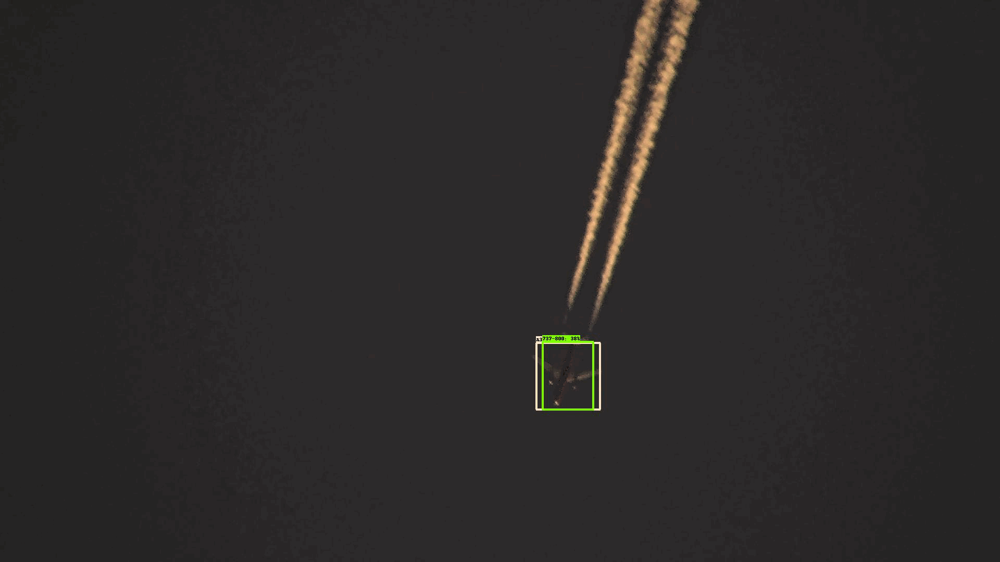

In [43]:

display(  IPyImage(open('skyScan_test_4.gif', 'rb').read()))


## Print fine tune predicted classes

In [44]:

ids_pred_classes = fine_tune_result_classes

ids_real_classes = [float(dict_label_id[label_real]) for label_real in real_class]

y_test = np.array(  ids_real_classes  )
y_pred = np.array(  ids_pred_classes  )

print_stats_percentage_train_test( y_test, y_pred)



Accuracy: 0.71
confusion matrix
[[ 48   0   1   0  19  57   0   0]
 [  0   8   0   5   8   6   0   0]
 [  1   0   2   1   1   1   0   1]
 [  1   1   0  52  13   1   0   2]
 [  0   2   0   3  27   1   0   0]
 [ 30   8   0   4  23 334   3   0]
 [  3   0   0   5   0   1  11   0]
 [  0   0   0   2   0   0   0  24]]
Precision: 0.736
Recall: 0.713
F1-measure: 0.713


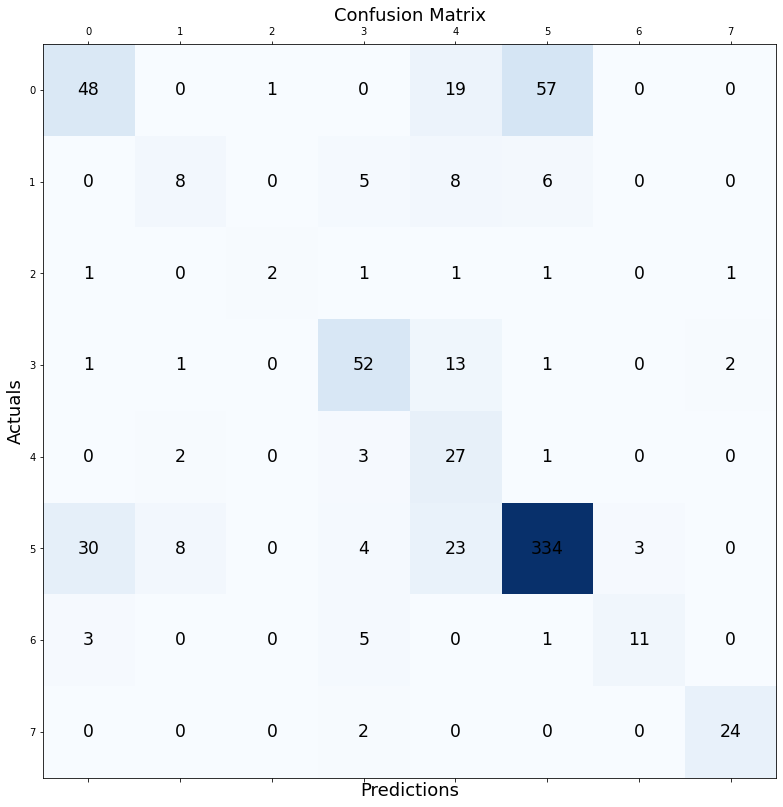

In [45]:


conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
fig, ax = plt.subplots(figsize=(13.5, 13.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=1.0)

for i in range(   conf_matrix.shape[0]   ):
  for j in range( conf_matrix.shape[1]   ):
    
    ax.text(x=j, y=i, s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
    

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()


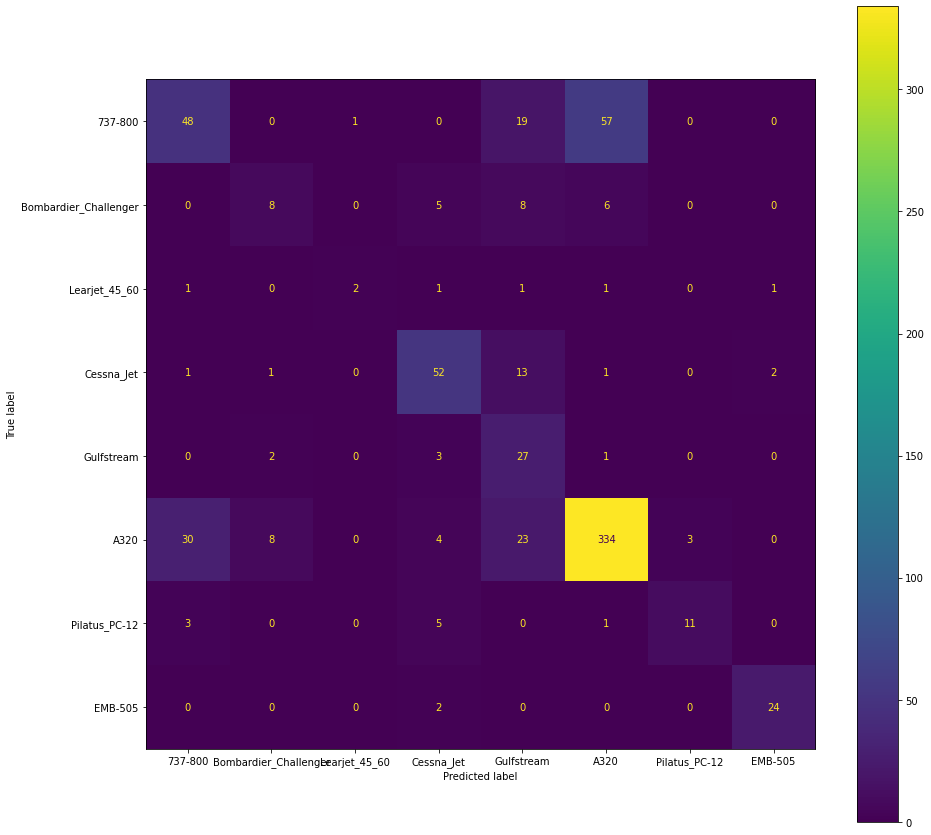

In [46]:

target_names = [dict_id_label[i+1] for i in range(num_classes)]
cmd = ConfusionMatrixDisplay(conf_matrix, display_labels=target_names)
fig, ax = plt.subplots(figsize=(15,15))
cmd.plot(ax=ax)


In [47]:



print(classification_report(y_test, y_pred))




              precision    recall  f1-score   support

         1.0       0.58      0.38      0.46       125
         2.0       0.42      0.30      0.35        27
         3.0       0.67      0.29      0.40         7
         4.0       0.72      0.74      0.73        70
         5.0       0.30      0.82      0.44        33
         6.0       0.83      0.83      0.83       402
         7.0       0.79      0.55      0.65        20
         8.0       0.89      0.92      0.91        26

    accuracy                           0.71       710
   macro avg       0.65      0.60      0.60       710
weighted avg       0.74      0.71      0.71       710



In [48]:

target_names = [dict_id_label[i+1] for i in range(num_classes)]

print(classification_report(y_test, y_pred, target_names=target_names))


                       precision    recall  f1-score   support

              737-800       0.58      0.38      0.46       125
Bombardier_Challenger       0.42      0.30      0.35        27
        Learjet_45_60       0.67      0.29      0.40         7
           Cessna_Jet       0.72      0.74      0.73        70
           Gulfstream       0.30      0.82      0.44        33
                 A320       0.83      0.83      0.83       402
        Pilatus_PC-12       0.79      0.55      0.65        20
              EMB-505       0.89      0.92      0.91        26

             accuracy                           0.71       710
            macro avg       0.65      0.60      0.60       710
         weighted avg       0.74      0.71      0.71       710



## Step 4: Now fine tune with adversarial train data (7.5%)

In [49]:


adversarial_train_image_dir = 'ReducedClasses_8_Corpus/adversarial/attackArtifacts/attackCloud/attackTrain/'
adv_class_dirs = os.listdir(adversarial_train_image_dir)
print(adv_class_dirs)



['737-800', 'Bombardier_Challenger', 'Learjet_45_60', 'Cessna_Jet', 'Gulfstream', 'A320', 'Pilatus_PC-12', 'EMB-505']


In [50]:


adv_train_images_np  = []
adv_gt_boxes         = []
adv_the_classes_list = []

i=0
for class_dir in adv_class_dirs:
  adv_path_per_class_imgs =   adversarial_train_image_dir + class_dir + "/"
  adv_file_imgs = [  f.replace(".txt", "") for f in os.listdir(adv_path_per_class_imgs) if f.endswith('.txt')  ]
  
  print(class_dir)

  for img in adv_file_imgs:
    the_path       = os.path.join(adv_path_per_class_imgs, img)
    
    box_img_coords = get_skyscan_box_data(the_path + '.txt')
    the_img        = load_image_into_numpy_array(the_path + '.jpg')
    

    adv_train_images_np.append(    the_img                                                 )
    adv_gt_boxes.append(           np.array([   box_img_coords   ], dtype=np.float32)      )
    adv_the_classes_list.append(   class_dir                                               )

    i = i + 1


737-800
Bombardier_Challenger
Learjet_45_60
Cessna_Jet
Gulfstream
A320
Pilatus_PC-12
EMB-505


In [51]:

print("adversarial samples for training")
print(    len(adv_the_classes_list)   )


adversarial samples for training
486


In [52]:


adv_train_image_tensors        = []
adv_gt_classes_one_hot_tensors = []
adv_gt_box_tensors             = []

for (train_image_np, gt_box_np, class_per_img) in zip(adv_train_images_np, adv_gt_boxes, adv_the_classes_list):
    
  adv_train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))

  adv_gt_box_tensors.append(     tf.convert_to_tensor(gt_box_np, dtype=tf.float32)     )
    
    
  index_class = dict_label_id[class_per_img] - 1
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
                    np.ones(shape=[gt_box_np.shape[0]],dtype=np.int32) - label_id_offset + index_class
  )
    
  one_hot_tensor = tf.one_hot(zero_indexed_groundtruth_classes, num_classes)
    
  adv_gt_classes_one_hot_tensors.append(one_hot_tensor)
  
  print(one_hot_tensor )
    


print('Done prepping data.')




tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[1. 0. 0. 0. 0. 0. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 1. 0. 0.]], shape=(1,

tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1, 8), dtype=float32)
tf.Tensor([[0. 0. 0. 0. 0. 0. 1. 0.]], shape=(1,

In [53]:


print('Start fine-tuning!', flush=True)

for idx in range(num_batches):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(adv_train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Note that we do not do data augmentation in this demo.  If you want a
  # a fun exercise, we recommend experimenting with random horizontal flipping
  # and random cropping :)

  gt_boxes_list   = [adv_gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [adv_gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [adv_train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)
    
    

print('Done fine-tuning!')




Start fine-tuning!
batch 0 of 200, loss=0.5133665
batch 10 of 200, loss=0.36322927
batch 20 of 200, loss=0.39784515
batch 30 of 200, loss=0.36631215
batch 40 of 200, loss=0.27655625
batch 50 of 200, loss=0.36544222
batch 60 of 200, loss=0.37761757
batch 70 of 200, loss=0.2272811
batch 80 of 200, loss=0.33726454
batch 90 of 200, loss=0.2998901
batch 100 of 200, loss=0.30327427
batch 110 of 200, loss=0.28830886
batch 120 of 200, loss=0.24080364
batch 130 of 200, loss=0.2605806
batch 140 of 200, loss=0.2903319
batch 150 of 200, loss=0.27959704
batch 160 of 200, loss=0.21426919
batch 170 of 200, loss=0.23143476
batch 180 of 200, loss=0.25835273
batch 190 of 200, loss=0.22549321
Done fine-tuning!


## Step 5: Now evaluate adversarially fine-tuned model with adversarial test data (7.5%) with no artifacts

In [54]:

test_image_dir = 'ReducedClasses_8_Corpus/adversarial/attackArtifacts/attackNoArtifact/attackTest/'
class_dirs = os.listdir(test_image_dir)
print(class_dirs)


['737-800', 'Bombardier_Challenger', 'Learjet_45_60', 'Cessna_Jet', 'Gulfstream', 'A320', 'Pilatus_PC-12', 'EMB-505']


In [55]:

real_class = []
test_images_np = []

for class_dir in class_dirs:
  path_per_class_imgs =   test_image_dir + class_dir + "/"
  file_imgs = [  f.replace(".jpg", "") for f in os.listdir(path_per_class_imgs) if f.endswith('.jpg')  ]
    

  print(class_dir)

  for img in file_imgs:
    the_path = os.path.join(path_per_class_imgs, img + '.jpg')
    
    test_images_np.append(np.expand_dims(   load_image_into_numpy_array(the_path), axis=0    )   )
    real_class.append(class_dir)
    



737-800
Bombardier_Challenger
Learjet_45_60
Cessna_Jet
Gulfstream
A320
Pilatus_PC-12
EMB-505


In [56]:

print("num samples testing")
print(    len(real_class)    )



num samples testing
357


In [57]:


n_times_class_not_predicted = 0

fine_tune_result_classes = []

for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

    
  classes = [cls for cls in detections['detection_classes'][detections['detection_scores'] > threshold]]
  ## print(classes)
  ## print(detections['detection_boxes'][0].numpy())
  if classes:
      the_class = classes[0].numpy() + label_id_offset
  else:
      the_class = 1.0
      n_times_class_not_predicted = n_times_class_not_predicted + 1
    
  fine_tune_result_classes.append(  the_class )
  ## print(the_class)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="pred_8_images_no_art/gif_frame_" + ('%02d' % i) + ".jpg")




In [58]:

n_times_class_not_predicted



0

In [59]:


filenames = glob.glob('pred_8_images_no_art/gif_frame_*.jpg')

length_test_samples = len(filenames)
print(length_test_samples)
num_list_indeces = random.sample(range(length_test_samples), 200)

filenames = [ filenames[i] for i in num_list_indeces ]
print(len(filenames))

filenames = sorted(filenames)
length_gifs = len(filenames)

gif_index_1 = int(  0.25 * length_gifs  )
gif_index_2 = int(  0.50 * length_gifs  )
gif_index_3 = int(  0.75 * length_gifs  )

## last = -1

gif_func([filenames[i] for i in range(gif_index_1)],              'no_art_skyScan_test_1.gif')
gif_func([filenames[i] for i in range(gif_index_1, gif_index_2)], 'no_art_skyScan_test_2.gif')
gif_func([filenames[i] for i in range(gif_index_2, gif_index_3)], 'no_art_skyScan_test_3.gif')
gif_func([filenames[i] for i in range(gif_index_3, length_gifs)], 'no_art_skyScan_test_4.gif')




357
200


In [79]:
## display(  IPyImage(open('no_art_skyScan_test_1.gif', 'rb').read()))

In [61]:


ids_pred_classes = fine_tune_result_classes

ids_real_classes = [float(dict_label_id[label_real]) for label_real in real_class]

y_test = np.array(  ids_real_classes  )
y_pred = np.array(  ids_pred_classes  )

print_stats_percentage_train_test( y_test, y_pred)



Accuracy: 0.60
confusion matrix
[[ 14   0   0   1   2  37   9   0]
 [  0   0   0   0   2   4   8   0]
 [  0   0   1   0   0   0   2   1]
 [  0   0   0  16   0   5  14   0]
 [  2   0   0   1   3   2   8   0]
 [ 15   0   0   0   0 171  15   0]
 [  0   0   0   1   0   1   9   0]
 [  0   0   0   4   0   0   9   0]]
Precision: 0.620
Recall: 0.599
F1-measure: 0.587


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


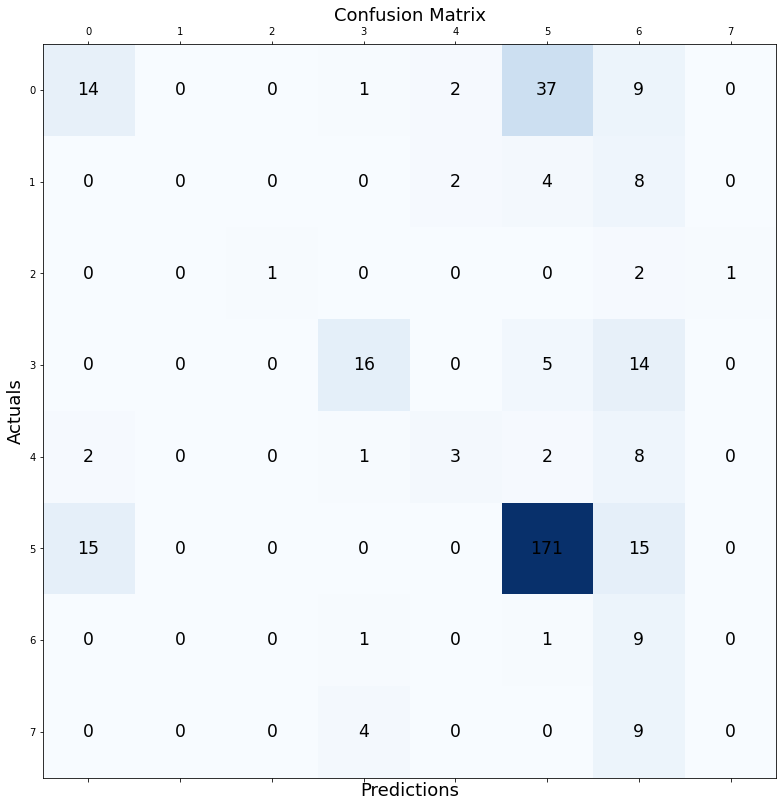

In [62]:


conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
fig, ax = plt.subplots(figsize=(13.5, 13.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=1.0)

for i in range(   conf_matrix.shape[0]   ):
  for j in range( conf_matrix.shape[1]   ):
    
    ax.text(x=j, y=i, s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
    

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()


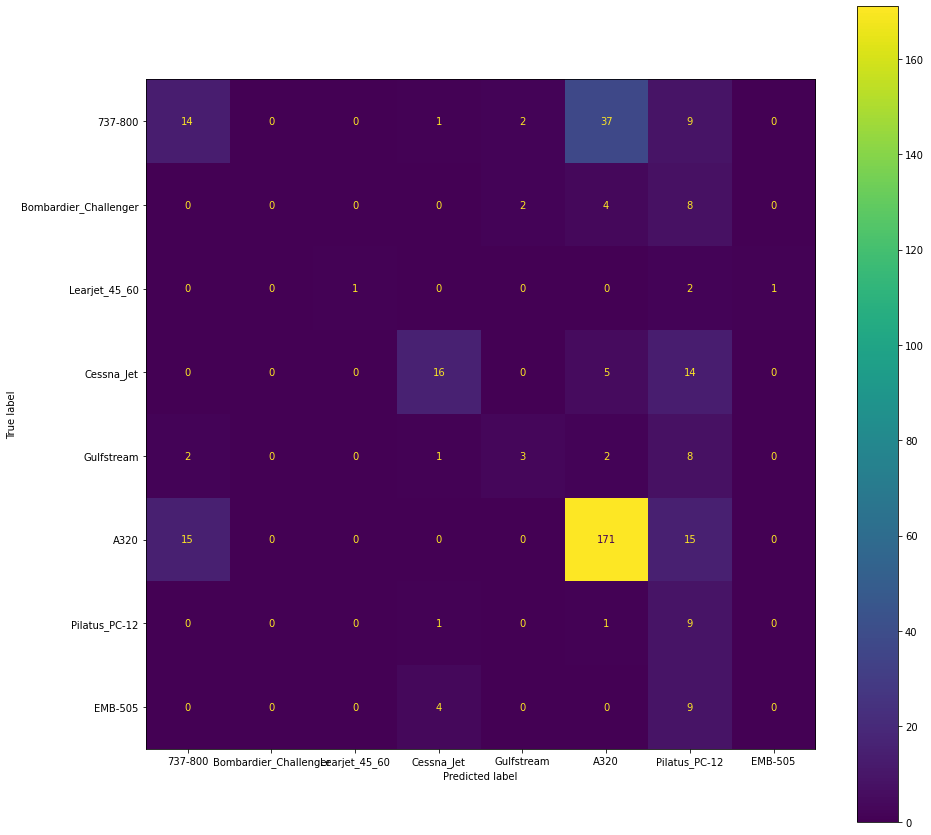

In [63]:


target_names = [dict_id_label[i+1] for i in range(num_classes)]
cmd = ConfusionMatrixDisplay(conf_matrix, display_labels=target_names)
fig, ax = plt.subplots(figsize=(15,15))
cmd.plot(ax=ax)



In [64]:

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

         1.0       0.45      0.22      0.30        63
         2.0       0.00      0.00      0.00        14
         3.0       1.00      0.25      0.40         4
         4.0       0.70      0.46      0.55        35
         5.0       0.43      0.19      0.26        16
         6.0       0.78      0.85      0.81       201
         7.0       0.12      0.82      0.21        11
         8.0       0.00      0.00      0.00        13

    accuracy                           0.60       357
   macro avg       0.43      0.35      0.32       357
weighted avg       0.62      0.60      0.59       357



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [65]:

target_names = [dict_id_label[i+1] for i in range(num_classes)]

print(classification_report(y_test, y_pred, target_names=target_names))



                       precision    recall  f1-score   support

              737-800       0.45      0.22      0.30        63
Bombardier_Challenger       0.00      0.00      0.00        14
        Learjet_45_60       1.00      0.25      0.40         4
           Cessna_Jet       0.70      0.46      0.55        35
           Gulfstream       0.43      0.19      0.26        16
                 A320       0.78      0.85      0.81       201
        Pilatus_PC-12       0.12      0.82      0.21        11
              EMB-505       0.00      0.00      0.00        13

             accuracy                           0.60       357
            macro avg       0.43      0.35      0.32       357
         weighted avg       0.62      0.60      0.59       357



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Step 6: Now evalaute adversarially fine-tuned model with adversarial test data (7.5%) with artifacts

In [66]:

test_image_dir = 'ReducedClasses_8_Corpus/adversarial/attackArtifacts/attackCloud/attackTest/'
class_dirs = os.listdir(test_image_dir)
print(class_dirs)


['737-800', 'Bombardier_Challenger', 'Learjet_45_60', 'Cessna_Jet', 'Gulfstream', 'A320', 'Pilatus_PC-12', 'EMB-505']


In [67]:

real_class = []
test_images_np = []

for class_dir in class_dirs:
  path_per_class_imgs =   test_image_dir + class_dir + "/"
  file_imgs = [  f.replace(".jpg", "") for f in os.listdir(path_per_class_imgs) if f.endswith('.jpg')  ]
    

  print(class_dir)

  for img in file_imgs:
    the_path = os.path.join(path_per_class_imgs, img + '.jpg')
    
    test_images_np.append(np.expand_dims(   load_image_into_numpy_array(the_path), axis=0    )   )
    real_class.append(class_dir)
    



737-800
Bombardier_Challenger
Learjet_45_60
Cessna_Jet
Gulfstream
A320
Pilatus_PC-12
EMB-505


In [68]:

print("num samples testing")
print(    len(real_class)    )




num samples testing
357


In [69]:


n_times_class_not_predicted = 0

fine_tune_result_classes = []

for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

    
  classes = [cls for cls in detections['detection_classes'][detections['detection_scores'] > threshold]]
  ## print(classes)
  ## print(detections['detection_boxes'][0].numpy())
  if classes:
      the_class = classes[0].numpy() + label_id_offset
  else:
      the_class = 1.0
      n_times_class_not_predicted = n_times_class_not_predicted + 1
    
  fine_tune_result_classes.append(  the_class )
  ## print(the_class)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="pred_8_images_yes_art/gif_frame_" + ('%02d' % i) + ".jpg")





In [70]:

n_times_class_not_predicted



0

In [71]:



filenames = glob.glob('pred_8_images_yes_art/gif_frame_*.jpg')

length_test_samples = len(filenames)
print(length_test_samples)
num_list_indeces = random.sample(range(length_test_samples), 200)

filenames = [ filenames[i] for i in num_list_indeces ]
print(len(filenames))

filenames = sorted(filenames)
length_gifs = len(filenames)

gif_index_1 = int(  0.25 * length_gifs  )
gif_index_2 = int(  0.50 * length_gifs  )
gif_index_3 = int(  0.75 * length_gifs  )

## last = -1

gif_func([filenames[i] for i in range(gif_index_1)],              'yes_art_skyScan_test_1.gif')
gif_func([filenames[i] for i in range(gif_index_1, gif_index_2)], 'yes_art_skyScan_test_2.gif')
gif_func([filenames[i] for i in range(gif_index_2, gif_index_3)], 'yes_art_skyScan_test_3.gif')
gif_func([filenames[i] for i in range(gif_index_3, length_gifs)], 'yes_art_skyScan_test_4.gif')



357
200


In [78]:

## display(  IPyImage(open('yes_art_skyScan_test_1.gif', 'rb').read()))


In [73]:


ids_pred_classes = fine_tune_result_classes

ids_real_classes = [float(dict_label_id[label_real]) for label_real in real_class]

y_test = np.array(  ids_real_classes  )
y_pred = np.array(  ids_pred_classes  )

print_stats_percentage_train_test( y_test, y_pred)



Accuracy: 0.57
confusion matrix
[[  4   0   0   1   0  24  34   0]
 [  0   0   0   0   2   4   8   0]
 [  0   0   1   0   0   0   2   1]
 [  0   0   0  16   0   5  14   0]
 [  2   0   0   1   3   2   8   0]
 [ 15   0   0   0   0 171  15   0]
 [  0   0   0   1   0   1   9   0]
 [  0   0   0   4   0   0   9   0]]
Precision: 0.608
Recall: 0.571
F1-measure: 0.565


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


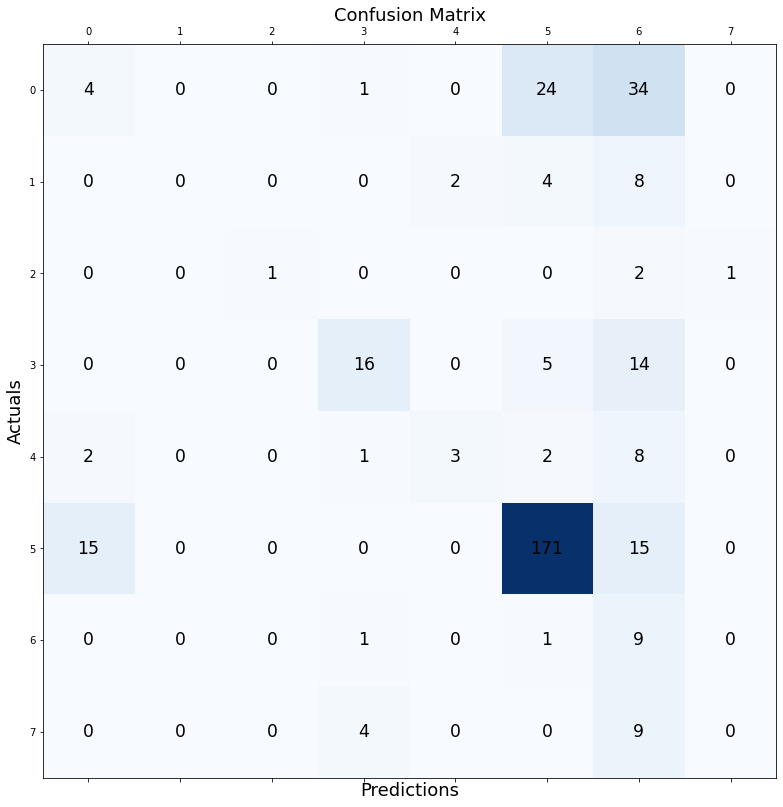

In [74]:


conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
fig, ax = plt.subplots(figsize=(13.5, 13.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=1.0)

for i in range(   conf_matrix.shape[0]   ):
  for j in range( conf_matrix.shape[1]   ):
    
    ax.text(x=j, y=i, s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
    

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()



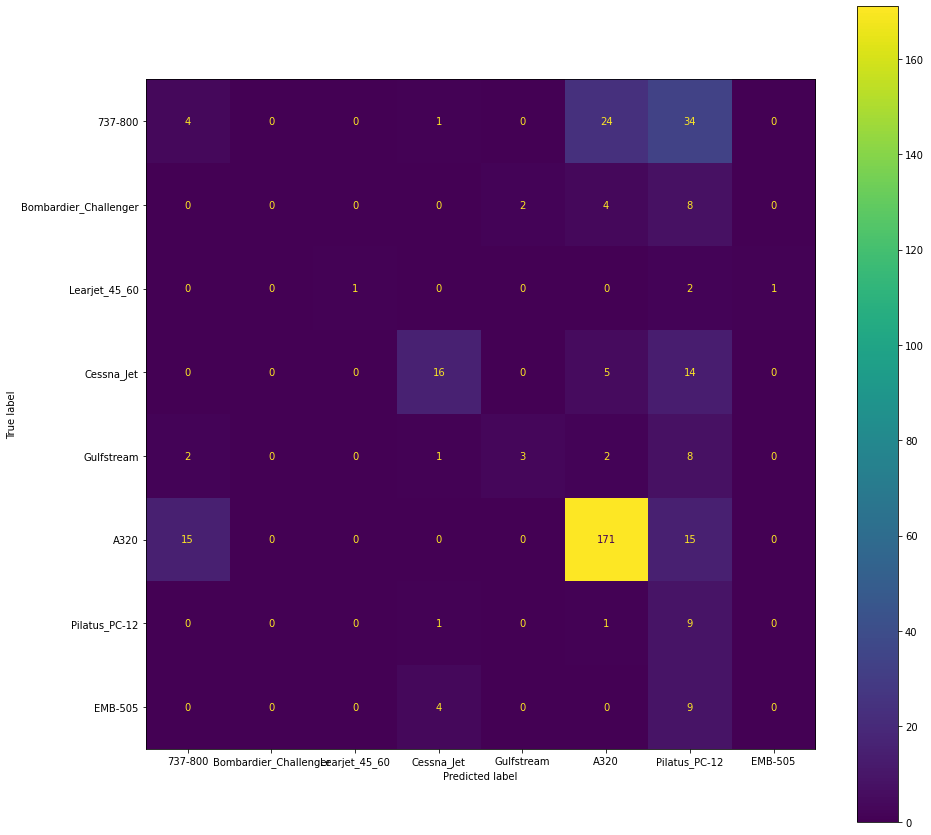

In [75]:


target_names = [dict_id_label[i+1] for i in range(num_classes)]
cmd = ConfusionMatrixDisplay(conf_matrix, display_labels=target_names)
fig, ax = plt.subplots(figsize=(15,15))
cmd.plot(ax=ax)



In [76]:


print(classification_report(y_test, y_pred))



              precision    recall  f1-score   support

         1.0       0.19      0.06      0.10        63
         2.0       0.00      0.00      0.00        14
         3.0       1.00      0.25      0.40         4
         4.0       0.70      0.46      0.55        35
         5.0       0.60      0.19      0.29        16
         6.0       0.83      0.85      0.84       201
         7.0       0.09      0.82      0.16        11
         8.0       0.00      0.00      0.00        13

    accuracy                           0.57       357
   macro avg       0.43      0.33      0.29       357
weighted avg       0.61      0.57      0.57       357



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [77]:

target_names = [dict_id_label[i+1] for i in range(num_classes)]

print(classification_report(y_test, y_pred, target_names=target_names))



                       precision    recall  f1-score   support

              737-800       0.19      0.06      0.10        63
Bombardier_Challenger       0.00      0.00      0.00        14
        Learjet_45_60       1.00      0.25      0.40         4
           Cessna_Jet       0.70      0.46      0.55        35
           Gulfstream       0.60      0.19      0.29        16
                 A320       0.83      0.85      0.84       201
        Pilatus_PC-12       0.09      0.82      0.16        11
              EMB-505       0.00      0.00      0.00        13

             accuracy                           0.57       357
            macro avg       0.43      0.33      0.29       357
         weighted avg       0.61      0.57      0.57       357



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
